In [1]:
from eda import *
from models_utils import *
import math
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from pygam import LinearGAM, s
from gradientBoosting import *
from mertonJumpDiffusion import *
from scipy.special import inv_boxcox
from scipy import stats
import matplotlib.dates as mdates
from math import sqrt
import warnings
from cycler import cycler
from statsmodels.stats.diagnostic import acorr_ljungbox
#alt.data_transformers.enable("vegafusion")


warnings.filterwarnings('ignore')

plt.rcParams['axes.prop_cycle'] = cycler(color=plt.cm.tab20.colors)

custom_colors = ["#948B80", "#625D56", "#312E2B", "#875C62", "#5F4045", "#B79DA1",
                "#417156", "#2E4F3C", "#6D7C73"]

# Table of contents
1. [Preprocessing](#preprocessing)
    1. [Train/Test split](#traintest)
    2. [Benchmark models](#benchmark)
    3. [Autocorrelation](#autocorr)
    4. [Stationarity](#stationarity)
    5. [Data transformation](#transformation)
2. [Models](#models)
    1. [ARIMA (AR, MA, ARMA, AND ARIMA)](#arima)
    2. [ARIMAX](#arimax)
    3. [Gradient Boosting](#boosting)
    4. [Merton Jump Diffusion Model](#diffusion)
3. [Results](#results)
4. [Investment Strategy](#investment)
    1. [Daily Returns](#returns)
    2. [Long Term Investment](#longInv)
5. [Outlook](#outlook)
6. [LSTM](#lstm)

# Preprocessing <a name="preprocessing"></a>


## Train /Test split<a name="traintest"></a>

Split the time seris into a train (85%) and test (15%) series

In [2]:
currency='BTC-USD'

train_df, test_df = load_train_val_test_data(
    file_name='data/exchange_v2.csv', 
    currency=currency,
    sizes=(0.85, 0.15)
)

bitcoin_df = pd.concat([train_df, test_df], ignore_index=True)

# Add a new column to each dataframe to indicate the dataset type
train_df['Dataset'] = 'Train'
#val_df['Dataset'] = 'Validation'
test_df['Dataset'] = 'Test'

# Concatenate the dataframes
combined_df = pd.concat([train_df,test_df])

# Create a single chart with a color encoding based on the dataset type
chart = alt.Chart(combined_df).mark_line(strokeWidth=0.8).encode(
    x=alt.X('date:T', axis=alt.Axis(format='%Y-%m')),
    y=alt.Y('Close:Q', scale=alt.Scale(domain=[combined_df['Close'].min() - 0.05, combined_df['Close'].max() + 0.05])),
    color=alt.Color('Dataset:N', scale=alt.Scale(range=["#625D56", "#875C62", "#2E4F3C"]))
).properties(
    width=800,
    height=300,
    title=f"{currency} Exchange Rate: Train/Test Split"
)

chart.save('graphs/btcusd/a_train_validation_test_split.json')
chart

alt.Chart(...)

## Benchmark models<a name="benchmark"></a>

Simple models are employed in model evaluation. A model must demonstrate superior performance compared to benchmark models, which include the mean of the training series, the last value of the training series, the drift of the training series, and the values of the most recent season (last 90 days), to be deemed useful.


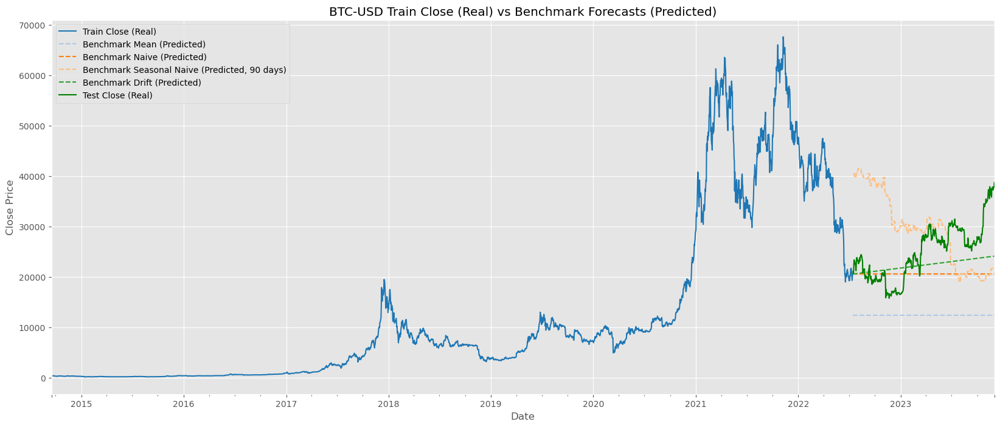

In [3]:
train_df, charts = preprocess(train_df, windows=(1, 3, 7, 30, 90, 365))
train_df, test_df = calc_benchmarks(train_df, test_df, seasonality=90)

In [4]:
benchmark_cols = [col for col in test_df.columns if "bench" in col]
benchmark_cols.append('Close')

# Reshape the DataFrame
long_df = test_df.melt(id_vars=['date'], value_vars=benchmark_cols, var_name='Benchmark', value_name='Value')

# Create the Altair Chart
chart = alt.Chart(long_df).mark_line(strokeWidth=0.6, point=False).encode(
    x=alt.X('date:T', axis=alt.Axis(format='%Y-%m')),
    y=alt.Y('Value:Q', scale=alt.Scale(domain=[10000, 50000])),
    color=alt.Color('Benchmark:N', scale=alt.Scale(range=custom_colors))
).properties(
    width=800,
    height=300,
    title=f"{currency} Benchmark models against Test Dataset."
).configure_point(
    size=10
)

# Line chart for actual data
actual_line = alt.Chart(long_df).mark_area(
    line={"color": "#F6E8D6", "strokeWidth":0.3},
    color=alt.Gradient(
        gradient="linear",
        stops=[
            alt.GradientStop(color="white", offset=0),
            alt.GradientStop(color="#F6E8D6", offset=1),
        ],
        x1=1,
        x2=1,
        y1=1,
        y2=0,
    ),
    strokeDash=[1,1]
).encode(
    y=alt.Y('Close:Q', scale=alt.Scale(domain=[10000, 50000]))
)

# Save the chart
chart.save('graphs/btcusd/b_benchmarks.json')

chart

alt.Chart(...)

Text(0.5, 1.0, 'Benchmark Residuals Plot')

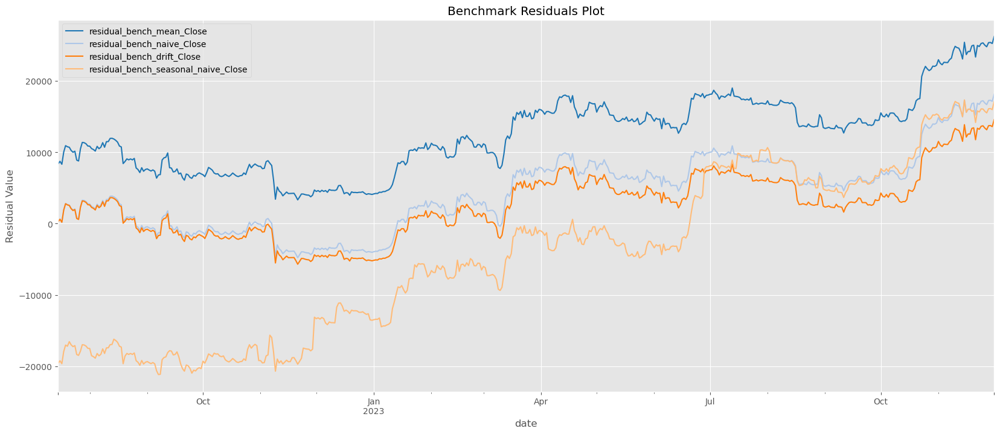

In [5]:
# List of benchmark columns
benchmark_cols = ['bench_mean_Close', 'bench_naive_Close', 
                  'bench_drift_Close', 'bench_seasonal_naive_Close']

# Calculate residuals and store in a new DataFrame
residuals_df = pd.DataFrame()

for col in benchmark_cols:
    residuals_df[f'residual_{col}'] = test_df['Close'] - test_df[col]
    
residuals_df.plot()

plt.ylabel("Residual Value")
plt.title("Benchmark Residuals Plot")

In [6]:
#calculate metrics for the benchmarking models
benchmark_metrics = calculate_forecast_metrics(test_df, actual_col='Close', benchmark_cols=benchmark_cols)
#benchmark_metrics.to_csv("graphs/btcusd/benchmark_metrics.csv")
benchmark_metrics.T

,MAE,MSE,RMSE,MAPE,R2
bench_mean_Close,12462.971646,1.841994e+08,13572.008284,47.570239,-5.379477
bench_naive_Close,5562.778895,4.783143e+07,6916.026724,20.449146,-0.656571
bench_drift_Close,4259.440336,2.769475e+07,5262.579713,16.324904,0.040833
bench_seasonal_naive_Close,10510.395003,1.502285e+08,12256.774267,47.236010,-4.202945


# Other charts of interest 

In [7]:
for chart in charts:
    chart.display()

alt.Chart(...)

alt.LayerChart(...)

## Autocorrelation<a name="autocorr"></a>

Examine autocorrelation to detect potential seasonal patterns and significant lags within the time series.

 ### Autocorrelation of the Close price of the train data series

[]

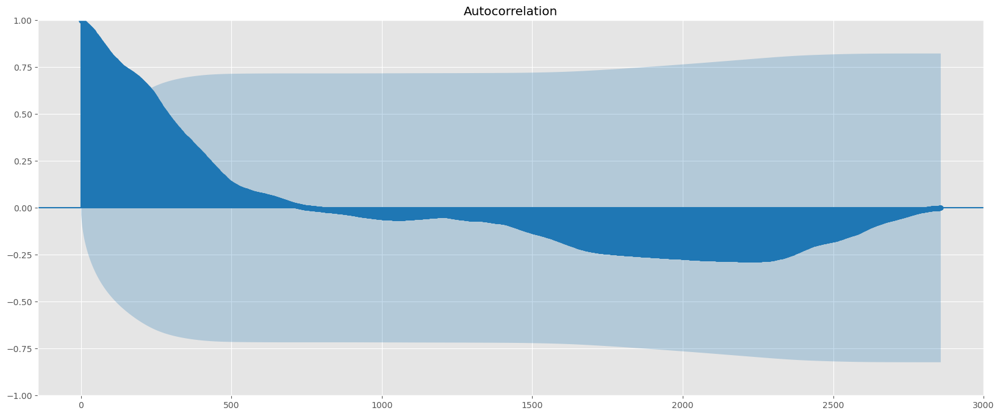

In [8]:
plot_acf((train_df['Close']).dropna(), lags=len(train_df)-1)
plt.plot()

No significant seasonal spikes have been observed, suggesting that there is no evident seasonality present within the series.

 ### Partial Autocorrelation of the Close price of the train data series

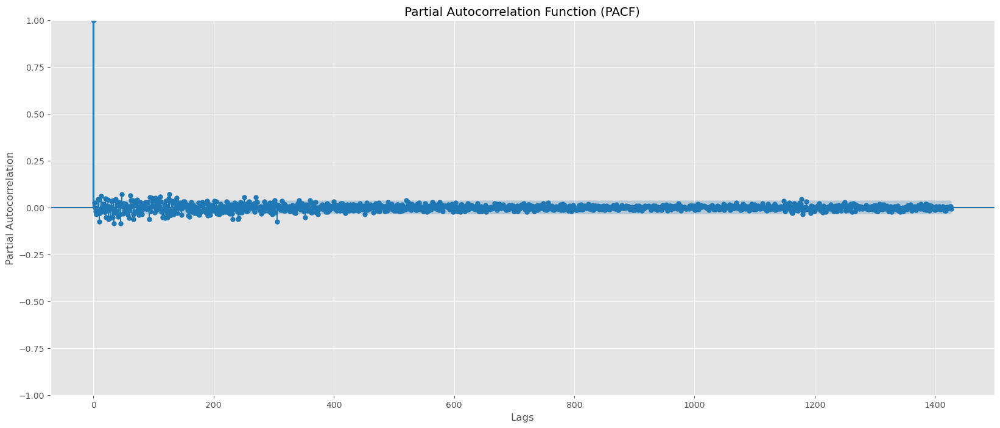

In [9]:
plot_pacf(train_df['Close'], lags=(len(train_df)/2)-2)
plt.title('Partial Autocorrelation Function (PACF)')
plt.xlabel('Lags')
plt.ylabel('Partial Autocorrelation')
plt.show()

No notable spikes are evident apart from lag 0, thereby confirming the assumption that the time series lacks seasonality.

## Stationarity<a name="stationarity"></a>

The time series exhibits non-stationarity; hence, we examine the behavior of the first-order difference.

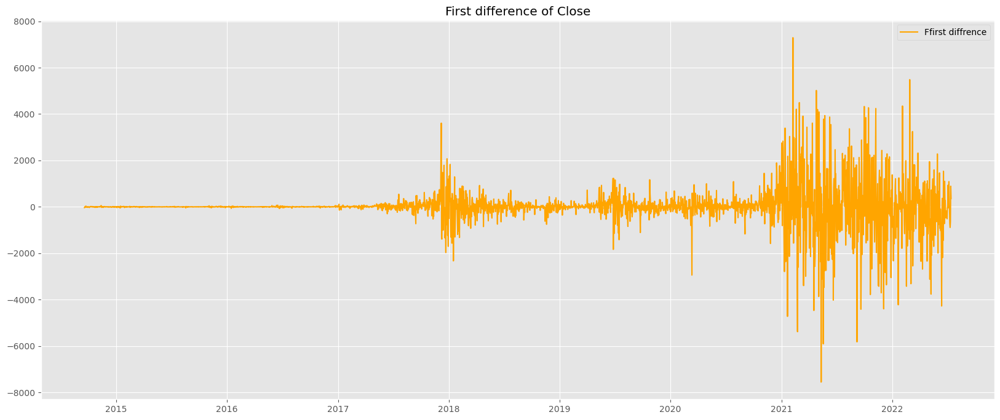

In [10]:
#plot first order difference
plt.plot(train_df['Close']-train_df['Close'].shift(1), label='Ffirst diffrence', color='orange')
plt.title('First difference of Close')
plt.legend()
plt.grid(True)

The plot of the first-order difference indicates a stationary time series. To validate this assumption, let's examine the autocorrelation.

### Autocorrelation on 1st order differenciation (1 day)


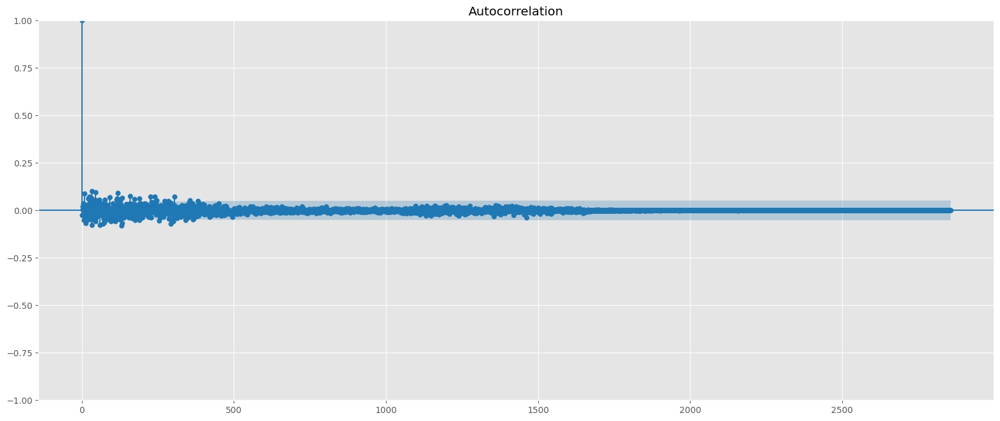

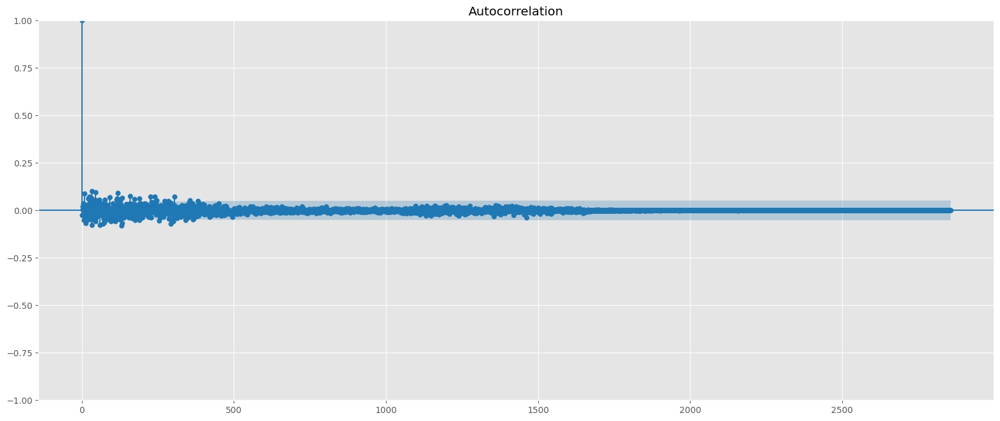

In [11]:
plot_acf((train_df['Close']-train_df['Close'].shift(1)).dropna(), lags=len(train_df)-2)

The autocorrelation suggests that the first difference is nearly stationary.

## Data transformation<a name="#transformation"></a>

To address the considerable volatility in Bitcoin's value, we employ a Box Cox transformation to stabilize it and reduce the potential for confounding or exacerbating model performance.

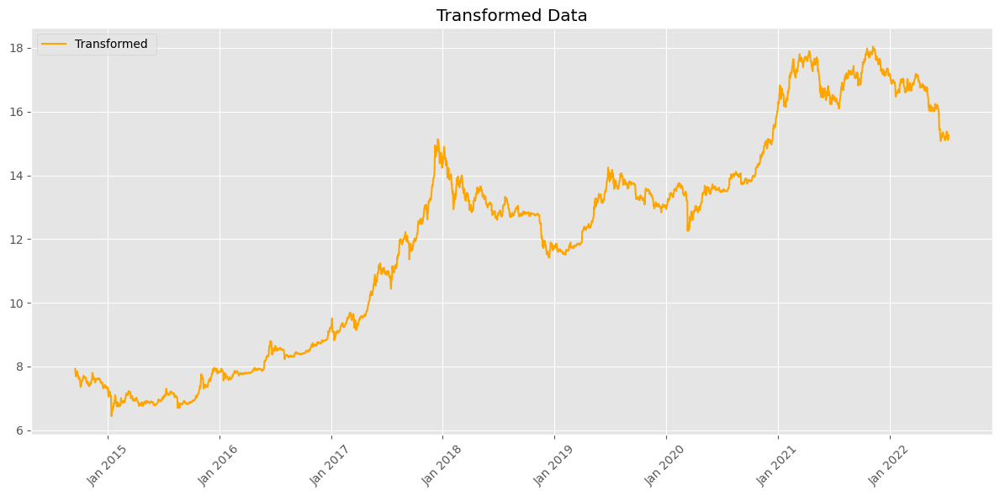

In [12]:
# # Apply box-cox transformation to the data
train_df['transf'], lambda_optimal = stats.boxcox(train_df['Close'])

plt.figure(figsize=(12, 6))
plt.plot(pd.to_datetime(train_df['date']), train_df['transf'], label='Transformed ', color='orange')
plt.title('Transformed Data')
plt.legend()
plt.grid(True)

# Set the date format for x-axis ticks
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

# Specify the frequency of ticks for months
plt.gca().xaxis.set_major_locator(mdates.YearLocator())

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [13]:
#return the inverse of the transformation
def inverse_bocxcx(predictions, lambda_optimal):
    predictions = inv_boxcox(predictions, lambda_optimal)
    
    return predictions

# Models<a name="models"></a>

## ARIMA (AR, MA, ARMA, AND ARIMA)<a name="arima"></a>

Based on the analysis of the PACF function and the stationary nature of the first-order difference, the parameters for the ARIMA model can be constrained to enhance simplicity. The suggested search space for the parameters is as follows: AR [0, 4], I [0, 1], MA [0, 4], considering indications favoring AR parameter 1 and I parameter 1 while maintaining a limited search range to prevent excessive model complexity. This approach aims to fit an ARIMA model based on the Box Cox transformation of the training dataset.

In [14]:
def create_arima_model(df, ar_order=1, i_order=0, ma_order=1, feature='transf', transformed = False):
    df_copy = df.copy()
    model_fit = ARIMA(df_copy[feature], order=(ar_order, i_order, ma_order)).fit()
    start_point = max((ar_order, ma_order, i_order))
    predictions = model_fit.predict(start=start_point, end=len(df_copy)-1, dynamic=False)
    
    #reverse transformation for the predictions
    #if transformed:
    #    predictions = inv_boxcox(predictions, lambda_optimal)
    
    # Reset indices to align the data
    df_copy = df_copy.reset_index(drop=True)
    predictions_reset = predictions.reset_index(drop=True)
    
    # Restore the original index
    df_copy.index = df.index
    predictions_reset.index = predictions.index
    
    df_copy[f'arima{ar_order}_{i_order}_{ma_order}_prediction'] = predictions
    
    return df_copy, model_fit, predictions_reset

In [15]:
def arima_forecast(df,model_fit):
    df_copy = df.copy()
    predictions = model_fit.forecast(steps=len(df_copy))
    predictions = inv_boxcox(predictions, lambda_optimal)
    
    df_copy[f'arima{ar_order}_{i_order}_{ma_order}_prediction'] = predictions
    
    return df_copy, predictions

In [16]:
#select best model based on AIC
def select_best_model(models):
    
    aic = models[0].aic
    model_fit = models[0]
    order = models[0].model.order
    
    for model in models:
        if model.aic < aic:
            aic = model.aic
            model_fit = model 
            order = model.model.order

    return model_fit


### Performance on the train data

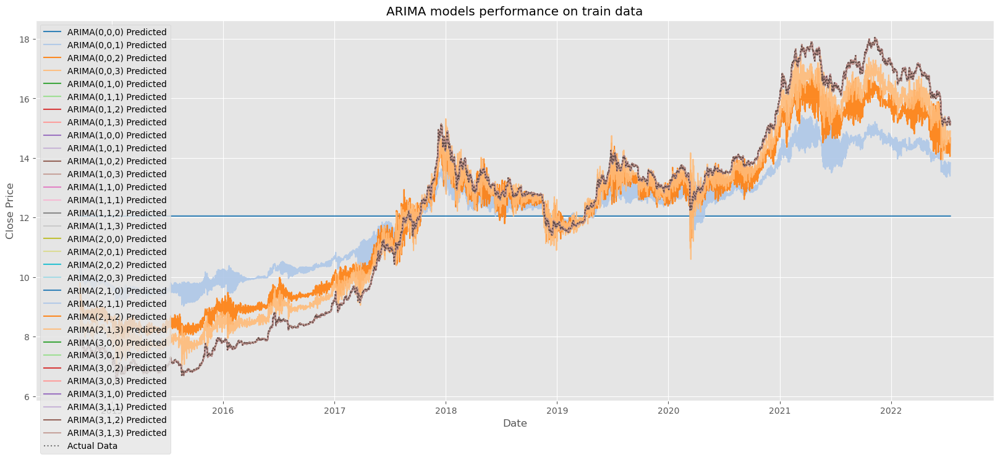

In [17]:
models = []
# Different combinations of AR and MA orders
arima_combinations = [(ar, i, ma) for ar in range(0,4) for i in [0,1] for ma in range(0,4)] 


for ar_order, i_order, ma_order in arima_combinations:
    train_df, model_arima, predictions_arima = create_arima_model(train_df, ar_order=ar_order, i_order=i_order, ma_order=ma_order, feature='transf', transformed = True)

    # Calculate the starting index for plotting
    start_index_for_plot = max((ar_order, ma_order, i_order))

    #plot model
    plt.plot(train_df.index[start_index_for_plot:], predictions_arima, label=f'ARIMA({ar_order},{i_order},{ma_order}) Predicted', alpha=0.9)
    models.append(model_arima)

plt.plot(train_df['transf'], label='Actual Data', color='black', alpha=0.5, linestyle='dotted')
plt.title(f'ARIMA models performance on train data')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()

Best model based on AIC is the ARIMA(1,1,2) model

In [18]:
best_model = select_best_model(models)
best_model.model.order

(1, 1, 2)

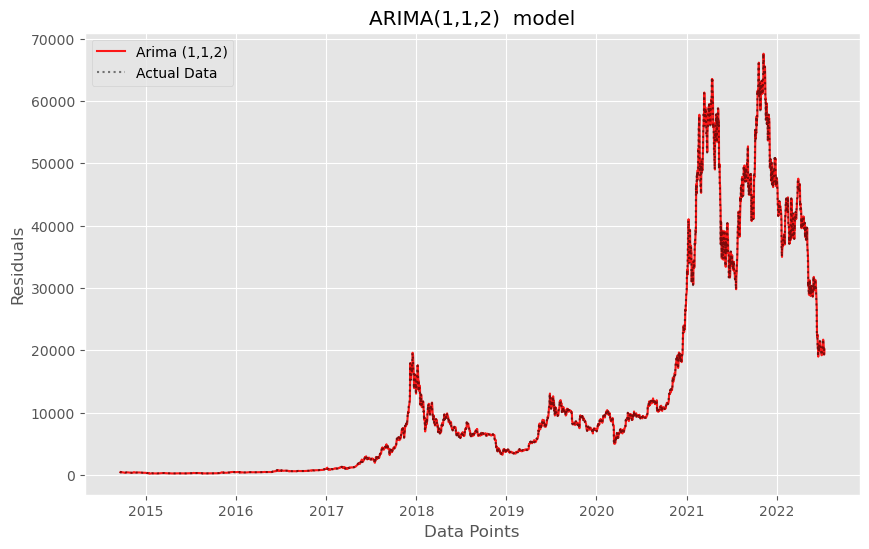

In [19]:
plt.figure(figsize=(10, 6))
plt.plot(inv_boxcox(train_df['arima1_1_2_prediction'],lambda_optimal), label='Arima (1,1,2)', color='red', alpha=0.9)
plt.plot(train_df['Close'], label='Actual Data', color='black', alpha=0.5, linestyle='dotted')
plt.title('ARIMA(1,1,2)  model')
plt.xlabel('Data Points')
plt.ylabel('Residuals')
plt.legend()
plt.grid(True)
plt.show()

### Residuals

Check if the residuals of the ARIMA(1,1,2) model behave like a white noise process

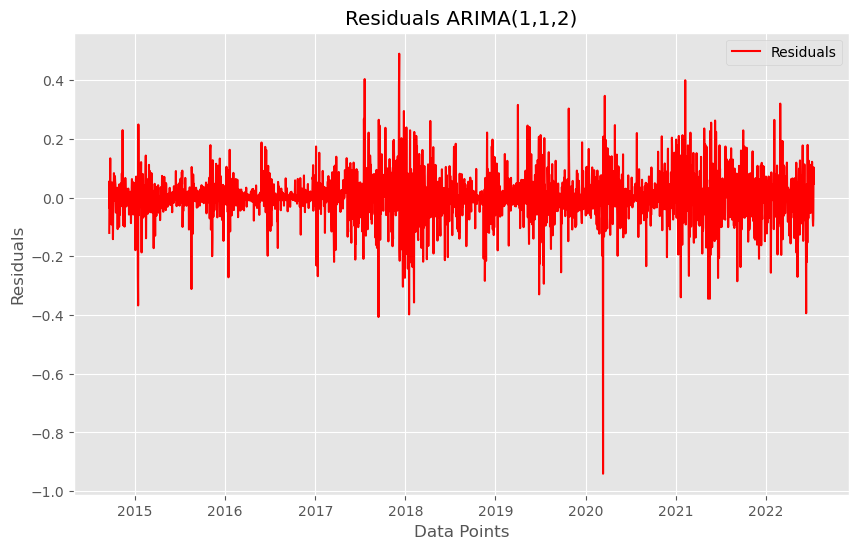

In [20]:
train_df['arima1_1_2_residuals'] = train_df['transf'] - train_df['arima1_1_2_prediction']

plt.figure(figsize=(10, 6))
plt.plot(train_df['arima1_1_2_residuals'], label='Residuals', color='red')
plt.title('Residuals ARIMA(1,1,2)')
plt.xlabel('Data Points')
plt.ylabel('Residuals')
plt.legend()
plt.grid(True)
plt.show()

In [21]:
mean_residuals = train_df['arima1_1_2_residuals'].mean()
print(f"Mean of residuals: {mean_residuals}")

Mean of residuals: 0.0018397762034987838


In [22]:
sm.stats.acorr_ljungbox(train_df['arima1_1_2_residuals'].dropna(), lags=[7,30,90,365,730], return_df=True)

,lb_stat,lb_pvalue
7,8.302803,0.306652
30,36.408358,0.195010
90,112.234834,0.056325
365,390.424531,0.172447
730,717.910854,0.618170


The ARIMA(1,1,2) model demonstrates considerable significance in accurately describing the training data, evidenced by the nearly white noise characteristics observed in the residuals. Additionally, the Ljung-Box test accepts the null hypothesis of no autocorrelation for common seasonal lags.

### Performance on the test data

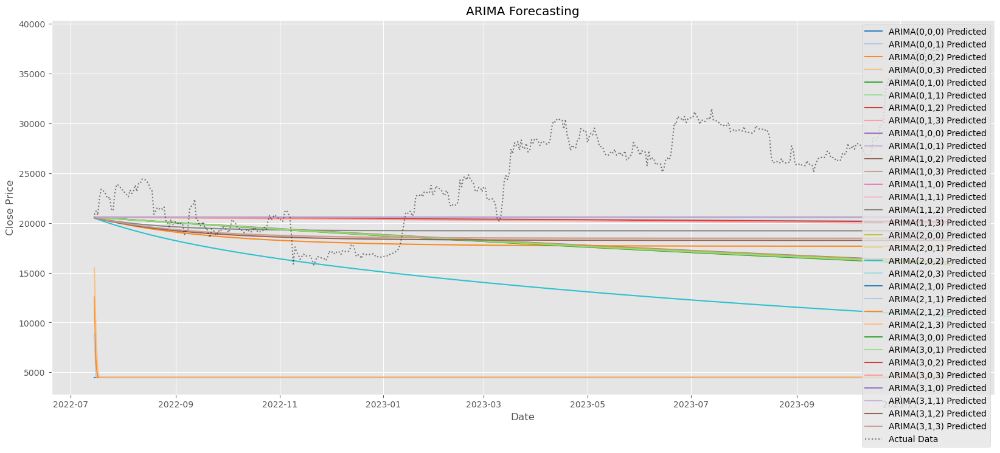

In [23]:
#get and plot predictions for the test dataset
for (ar_order, i_order, ma_order), model in zip(arima_combinations, models):
    test_df,predictions_arima = arima_forecast(test_df,model_fit=model)
    
    plt.plot(test_df.index, predictions_arima, label=f'ARIMA({ar_order},{i_order},{ma_order}) Predicted', alpha=0.9)

plt.plot(test_df['Close'], label='Actual Data', color='black', alpha=0.5, linestyle='dotted')
plt.title(f'ARIMA Forecasting')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()

Predictions of the ARIMA (1,1,2) which performed best on the train data 

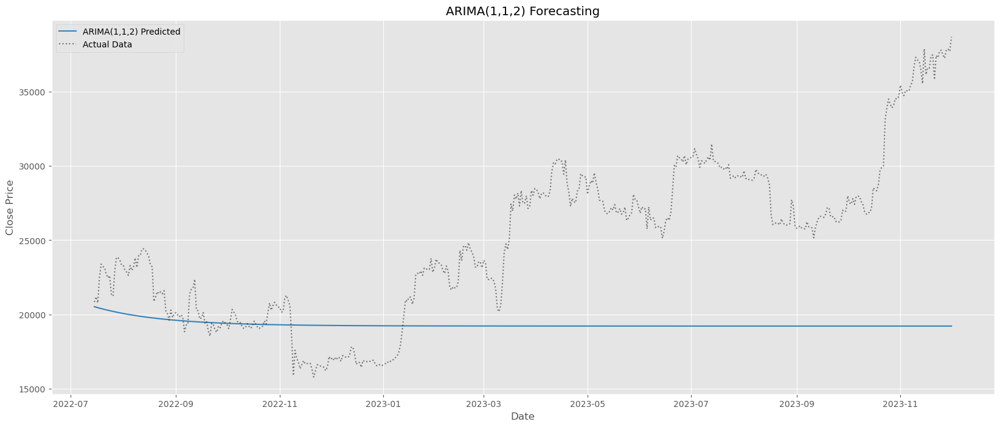

In [24]:
plt.plot(test_df.index, test_df['arima1_1_2_prediction'], label=f'ARIMA(1,1,2) Predicted', alpha=0.9)
plt.plot(test_df['Close'], label='Actual Data', color='black', alpha=0.5, linestyle='dotted')
plt.title(f'ARIMA(1,1,2) Forecasting')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()

In [25]:
#get metrics of the quality of the forecast
arima_cols = [f'arima{ar}_{i}_{ma}_prediction' for ar,i, ma in arima_combinations]
arima_metrics = calculate_forecast_metrics(test_df, actual_col='Close', benchmark_cols=arima_cols)
arima_metrics.T.sort_values(by='MSE', ascending=True)

,MAE,MSE,RMSE,MAPE,R2
arima3_1_0_prediction,5551.118261,4.761991e+07,6900.717792,20.416673,-0.649246
arima3_1_1_prediction,5551.135243,4.762020e+07,6900.739054,20.416722,-0.649256
arima1_1_3_prediction,5552.006300,4.763591e+07,6901.877103,20.419154,-0.649800
arima0_1_3_prediction,5552.128618,4.763819e+07,6902.042687,20.419486,-0.649879
arima0_1_2_prediction,5555.576444,4.770107e+07,6906.596149,20.429039,-0.652057
arima2_1_0_prediction,5555.834507,4.770574e+07,6906.934289,20.429758,-0.652219
arima2_1_1_prediction,5558.658884,4.775253e+07,6910.320290,20.438141,-0.653839
arima0_1_0_prediction,5562.778895,4.783143e+07,6916.026724,20.449146,-0.656571
arima1_1_1_prediction,5564.490768,4.786240e+07,6918.265572,20.453934,-0.657644
arima1_1_0_prediction,5566.181707,4.789305e+07,6920.480595,20.458659,-0.658706


ARIMA models exhibit strong performance on the training dataset, yet they encounter challenges in capturing the volatility present in the test data. The ARIMA(1,1,2) model, which performs best on the training dataset, does not demonstrate a good performance when applied to the test data.

## ARIMAX<a name="arimax"></a>

Include the timestamp (epoch) as an exogenous variable within the ARIMA model to enhance its ability to capture the volatility present in the data.

In [26]:
# Fit ARIMAX model
def train_and_plot_arima(df, orders, exg=None):
    models = []
    
    # Loop through each combination and plot the fitted values
    for ar_order, i_order, ma_order in arima_combinations:

        if exg is not None:
            model_fit = sm.tsa.SARIMAX(df, 
                                       exog=exg, 
                                       order=(ar_order, i_order, ma_order), 
                                       seasonal_order=(0, 0, 0, 0)).fit()
        else:    
            model_fit = ARIMA(df, order=(ar_order, i_order, ma_order)).fit()
            
        plt.plot(model_fit.fittedvalues, label=f'ARIMA({ar_order},{i_order},{ma_order})', alpha=0.5)
    
        # Save the model if you need it later
        models.append((model_fit, (ar_order, i_order, ma_order)))
        
    
    plt.plot(df, label="Original Dataset", color='black', alpha=0.9, linewidth=2)
    
    # Add legend and grid to the plot
    plt.legend()
    plt.grid(True)
    
    # Set the title and labels
    plt.title('Fitted Values of ARIMA Models')
    plt.xlabel('Date')
    plt.ylabel('Close Price')
    
    # Set the range of the y-axis here
    plt.ylim(0, 20)
    
    # Finally, show the plot
    plt.show()

    return models

#select best model based on AIC
def select_model(models):
    aic = models[0][0].aic
    model_fit = models[0][0]
    order = models[0][1]
    for model in models:
        if model[0].aic < aic:
            aic = model[0].aic
            model_fit = model[0]
            order = model[1]
            
    return model_fit

In [27]:
def forecast_and_plot(model_fit, df, test_df, transformed=False, lambda_optimal=None, exg=None):
    if exg is None:
        predictions = model_fit.forecast(steps=len(test_df['Close']))
    else:
        predictions = model_fit.forecast(steps=len(test_df['Close']), exog=exg)
    if transformed:
        predictions = inv_boxcox(predictions, lambda_optimal)
    
    # The index of 'predictions' should align with the index of 'test_df'
    predictions.index = test_df.index
    
    # Calculate RMSE
    rmse = sqrt(mean_squared_error(test_df["Close"], predictions))
    print('Test RMSE: %.3f' % rmse)
    
    # Plotting the results
    plt.figure(figsize=(12, 6))
    
    # Plot training data
    plt.plot(df["Close"], label='Training Data')
    
    # Plot predicted values
    plt.plot(predictions, color='blue', label='Predicted Test Data')
    
    # Plot actual test values
    plt.plot(test_df["Close"], color='green', label='Actual Test Data')
    
    plt.title('Train, Predicted Test, and Actual Test Data')
    plt.legend()
    
    plt.show()
    
    return predictions

### Performance on the train data

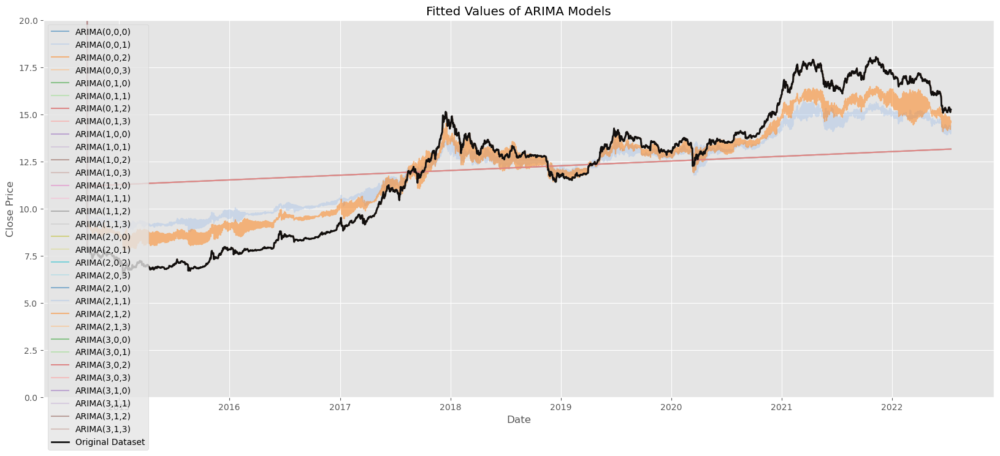

In [28]:
# Train ARIMAX
arima_combinations = [(ar, i, ma) for ar in range(0,4) for i in [0,1] for ma in range(0,4)]  # Different combinations of AR and MA orders
train_df['epoch'] = (train_df['date'] - pd.Timestamp("1970-01-01")) // pd.Timedelta('1s')
models = train_and_plot_arima(train_df['transf'], arima_combinations, exg=train_df['epoch'])

Best ARIMAX model based on the AIC is the model ARIMAX(1,1,0)

In [29]:
model_fit = select_model(models)

In [30]:
model_fit.model.order

(1, 1, 0)

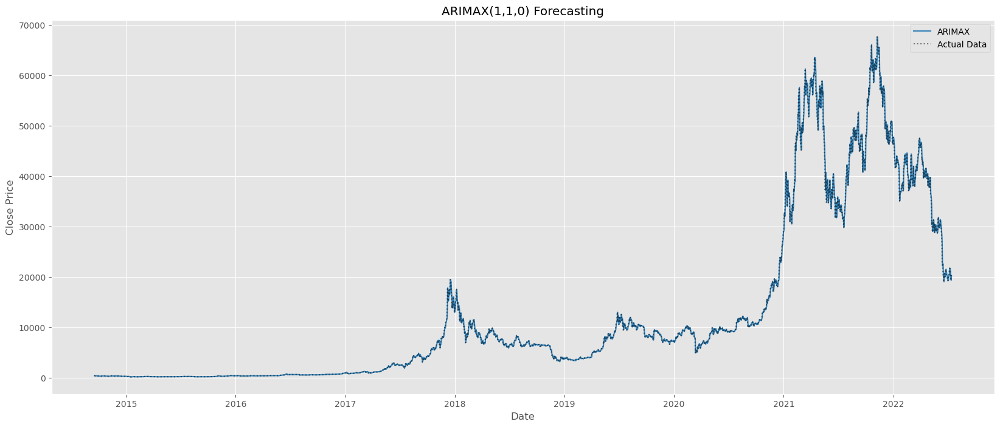

In [31]:
#plot the best model
start_point = max(model_fit.model.order)
predictions = model_fit.predict(start=start_point, end=len(train_df)-1, dynamic=False)
train_df['ARIMAX_prediction_transf'] = predictions
predictions = inv_boxcox(predictions, lambda_optimal)

train_df['ARIMAX_prediction'] = predictions

plt.plot(train_df.index[start_point:], predictions, label='ARIMAX', alpha=0.9)
plt.plot(train_df['Close'], label='Actual Data', color='black', alpha=0.5, linestyle='dotted')
plt.title(f'ARIMAX(1,1,0) Forecasting')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()

In [32]:
train_df.head()

,date,Open,High,Low,Close,Adj Close,Volume,currency,Dataset,mov1,...,arima3_0_2_prediction,arima3_0_3_prediction,arima3_1_0_prediction,arima3_1_1_prediction,arima3_1_2_prediction,arima3_1_3_prediction,arima1_1_2_residuals,epoch,ARIMAX_prediction_transf,ARIMAX_prediction
date,,,,,,,,,,,,,,,,,,,,,
2014-09-17,2014-09-17,465.864014,468.174011,452.421997,457.334015,457.334015,21056800,BTC-USD,Train,457.334015,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1410912000,NaN,NaN
2014-09-18,2014-09-18,456.859985,456.859985,413.104004,424.440002,424.440002,34483200,BTC-USD,Train,424.440002,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1410998400,7.933431,458.048164
2014-09-19,2014-09-19,424.102997,427.834991,384.532013,394.795990,394.795990,37919700,BTC-USD,Train,394.795990,...,NaN,NaN,NaN,NaN,NaN,NaN,-0.120253,1411084800,7.813835,425.791740
2014-09-20,2014-09-20,394.673004,423.295990,389.882996,408.903992,408.903992,36863600,BTC-USD,Train,408.903992,...,7.690051,7.693330,7.691028,7.691027,7.690851,7.689102,0.056221,1411171200,7.695893,396.038241
2014-09-21,2014-09-21,408.084991,412.425995,393.181000,398.821014,398.821014,26580100,BTC-USD,Train,398.821014,...,7.748562,7.748008,7.742866,7.742865,7.744010,7.744525,-0.036541,1411257600,7.749274,409.259566


In [33]:
arimax_metrics_train = calculate_forecast_metrics(train_df.dropna(), actual_col='Close', benchmark_cols=['ARIMAX_prediction'])
arimax_metrics_train.T

,MAE,MSE,RMSE,MAPE,R2
ARIMAX_prediction,406.137633,745004.09619,863.136198,2.597828,0.997426


### Residuals

Check if the residuals of the ARIMAX(1,1,0) model behave like a white noise process

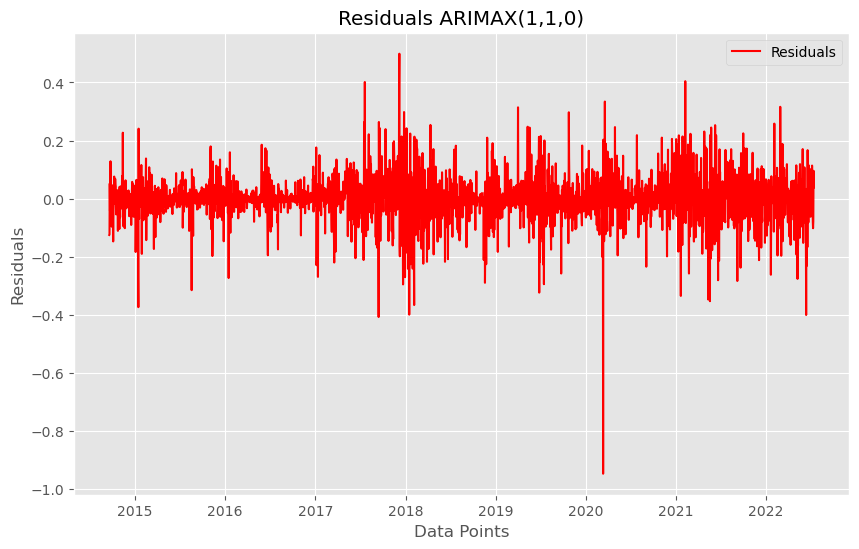

In [34]:
# Plot residuals
train_df['arimax_residuals'] = train_df['transf'] - train_df['ARIMAX_prediction_transf']


plt.figure(figsize=(10, 6))
plt.plot(train_df['arimax_residuals'], label='Residuals', color='red')
plt.title('Residuals ARIMAX(1,1,0)')
plt.xlabel('Data Points')
plt.ylabel('Residuals')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# Creating Altair plot for residuals
chart_df = train_df[['date','arimax_residuals']].copy()
chart_df = chart_df.dropna()

#train_close_df = test_df[['date', 'Close']].copy()

residuals_chart = alt.Chart(train_df).mark_line().encode(
    x='date',
    y='arimax_residuals',
).properties(
    width=800,
    height=300,
    title='Train residuals ARIMAX(1,1,0)'
).configure_mark(color="#625D56")

residuals_chart

In [ ]:
mean_residuals = train_df['arimax_residuals'].mean()
variance_residuals = train_df['arimax_residuals'].var()

print(f"Mean of residuals: {mean_residuals}")

In [ ]:
sm.stats.acorr_ljungbox(train_df['arimax_residuals'].dropna(), lags=[1,30,90,365,730], return_df=True)

The plot, mean analysis of residuals, and Ljung-Box tests for lags 1, 30, 365, and 730 suggest a white noise pattern within the residuals. However, the Ljung-Box test specifically at lag 90 implies the possibility of a seasonal pattern at this interval. Consequently, examine the Autocorrelation Function (ACF) of the residuals for further insights.

In [ ]:
plt.figure(figsize=(10, 6))
plot_acf(train_df['arimax_residuals'].dropna(), lags=90, alpha=0.05)
plt.title('Autocorrelation of Residuals')
plt.xlabel('Lags')
plt.ylabel('Autocorrelation')
plt.show()

The Autocorrelation Function (ACF) at lag 90 does not demonstrate statistical significance, indicating the absence of seasonality at this specific lag. Consequently, there is no evidence suggesting a seasonal pattern, and the residuals appear to follow a white noise process.

### Performance on the test data

In [ ]:
test_df['epoch'] = (test_df['date'] - pd.Timestamp("1970-01-01")) // pd.Timedelta('1s')
predictions = forecast_and_plot(model_fit, train_df, test_df, transformed=True, lambda_optimal=lambda_optimal, exg=test_df['epoch'])
test_df['arimax_prediction'] = predictions


In [ ]:
#altair plotting

# Create DataFrames for each set of values
train_close_df = test_df[['date', 'Close']].copy()
train_close_df.columns = ['date', 'value']
train_close_df['symbol'] = 'Close'

arimax_train_df = train_df[['date', 'ARIMAX_prediction']].copy()
arimax_train_df.columns = ['date', 'value']
arimax_train_df['symbol'] = 'ARIMAX model'

close_test_df = test_df[['date', 'Close']].copy()
close_test_df.columns = ['date', 'value']
close_test_df['symbol'] = 'Close'

arimax_test_df = test_df[['date', 'arimax_prediction']].copy()
arimax_test_df.columns = ['date', 'value']
arimax_test_df['symbol'] = 'ARIMAX model'

# Concatenate the DataFrames together
combined_df = pd.concat([train_close_df, arimax_train_df, close_test_df,arimax_test_df], ignore_index=True)

combined_df.head()



In [41]:
chart = alt.Chart(combined_df).mark_line(strokeWidth=0.6, point=False).encode(
    x=alt.X('date:T', axis=alt.Axis(format='%Y-%m')),
    y=alt.Y('value:Q', scale=alt.Scale(domain=[0, 70000])),
    color=alt.Color('symbol:N', scale=alt.Scale(range=custom_colors))
).properties(
    width=800,
    height=300,
    title=f"ARIMAX (1,1,0) model"
).configure_point(
    size=10
)

# Save the chart
chart.save('graphs/btcusd/arimax.json')

chart

alt.Chart(...)

In [42]:
test_df['arimax_prediction'] = predictions
arimax_metrics = calculate_forecast_metrics(test_df.dropna(), actual_col='Close', benchmark_cols=['arimax_prediction'])
arimax_metrics.T

,MAE,MSE,RMSE,MAPE,R2
arimax_prediction,3364.390961,1.759863e+07,4195.072128,15.502013,0.390497


In [43]:
train_df

,date,Open,High,Low,Close,Adj Close,Volume,currency,Dataset,mov1,...,arima3_0_3_prediction,arima3_1_0_prediction,arima3_1_1_prediction,arima3_1_2_prediction,arima3_1_3_prediction,arima1_1_2_residuals,epoch,ARIMAX_prediction_transf,ARIMAX_prediction,arimax_residuals
date,,,,,,,,,,,,,,,,,,,,,
2014-09-17,2014-09-17,465.864014,468.174011,452.421997,457.334015,457.334015,21056800,BTC-USD,Train,457.334015,...,NaN,NaN,NaN,NaN,NaN,NaN,1410912000,NaN,NaN,NaN
2014-09-18,2014-09-18,456.859985,456.859985,413.104004,424.440002,424.440002,34483200,BTC-USD,Train,424.440002,...,NaN,NaN,NaN,NaN,NaN,NaN,1410998400,7.933431,458.048164,-0.124787
2014-09-19,2014-09-19,424.102997,427.834991,384.532013,394.795990,394.795990,37919700,BTC-USD,Train,394.795990,...,NaN,NaN,NaN,NaN,NaN,-0.120253,1411084800,7.813835,425.791740,-0.123041
2014-09-20,2014-09-20,394.673004,423.295990,389.882996,408.903992,408.903992,36863600,BTC-USD,Train,408.903992,...,7.693330,7.691028,7.691027,7.690851,7.689102,0.056221,1411171200,7.695893,396.038241,0.051966
2014-09-21,2014-09-21,408.084991,412.425995,393.181000,398.821014,398.821014,26580100,BTC-USD,Train,398.821014,...,7.748008,7.742866,7.742865,7.744010,7.744525,-0.036541,1411257600,7.749274,409.259566,-0.042010
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-07-10,2022-07-10,21591.080078,21591.080078,20727.123047,20860.449219,20860.449219,28688807249,BTC-USD,Train,20860.449219,...,15.360895,15.363676,15.363683,15.357124,15.357242,-0.074379,1657411200,15.364482,21620.317839,-0.080190
2022-07-11,2022-07-11,20856.353516,20856.353516,19924.539062,19970.556641,19970.556641,24150249025,BTC-USD,Train,19970.556641,...,15.287114,15.285746,15.285763,15.282223,15.280816,-0.095853,1657497600,15.288537,20900.046584,-0.101642
2022-07-12,2022-07-12,19970.474609,20043.445312,19308.531250,19323.914062,19323.914062,25810220018,BTC-USD,Train,19323.914062,...,15.186192,15.187300,15.187301,15.183312,15.182892,-0.071537,1657584000,15.191564,20012.402781,-0.077977


The model fails to capture the volatility within the test data; however, it accurately predicts the trend.

## Gradient boosting<a name="boosting"></a>


Gradient boosting demonstrates robustness in handling diverse feature distributions, including high variances, non-Gaussian distributions, and outliers. Hence, no Box-Cox transformation is applied to the training data.

The input features for gradient boosting are derived from the date and encompass the following extracted elements:

- Year
- Month
- Day
- Weekday

In [44]:
# Convert date column to datetime and extract date features
def split_date(df):
    df['date'] = pd.to_datetime(df['date'])
    df['year'] = df['date'].dt.year
    df['month'] = df['date'].dt.month
    df['day'] = df['date'].dt.day
    df['weekday'] = df['date'].dt.weekday
    
    return df

In [45]:
train_df = split_date(train_df)
test_df = split_date(test_df)

#features and target for the gradient boosting
features = ['year','month','day', 'weekday']
target_variable = 'Close'

Create the gradient boosting model hyperparameters are tuned with cross validation for time series

In [46]:
#create gradient boosting model and prdictions for train and test data
model, trainPredictions, testPredictions, trainR2, testR2 = gradient_boosting(train_df,test_df,features,target_variable)
test_df['gboosting_prediction'] = testPredictions
train_df['gboosting_model'] = trainPredictions

#### Performace on the train data

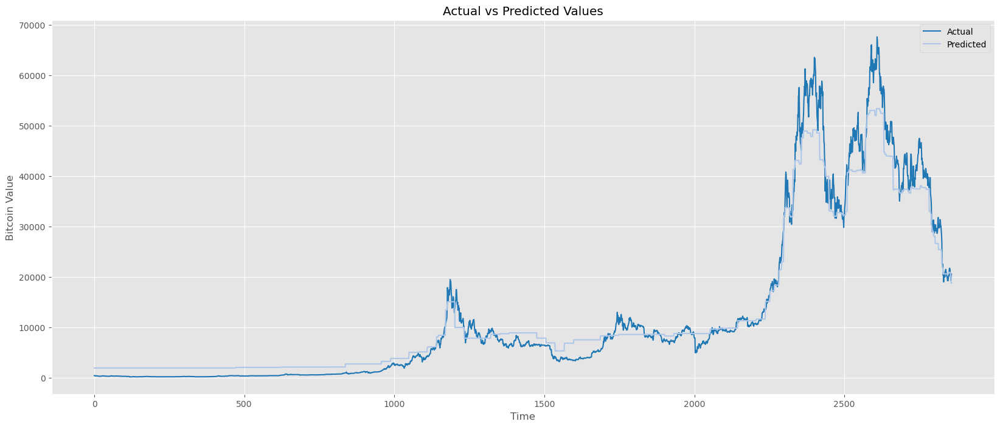

In [47]:
create_plot(train_df[target_variable], trainPredictions)

In [48]:
print(f"R2 score of gradient boosting model: {trainR2}")

R2 score of gradient boosting model: 0.966707961084771


A R2 score of 0.9667 signifies the model's significance, yet there remains potential for enhancement. The model's fit, while notable, falls slightly behind the performance of the ARIMA models.

### Residuals

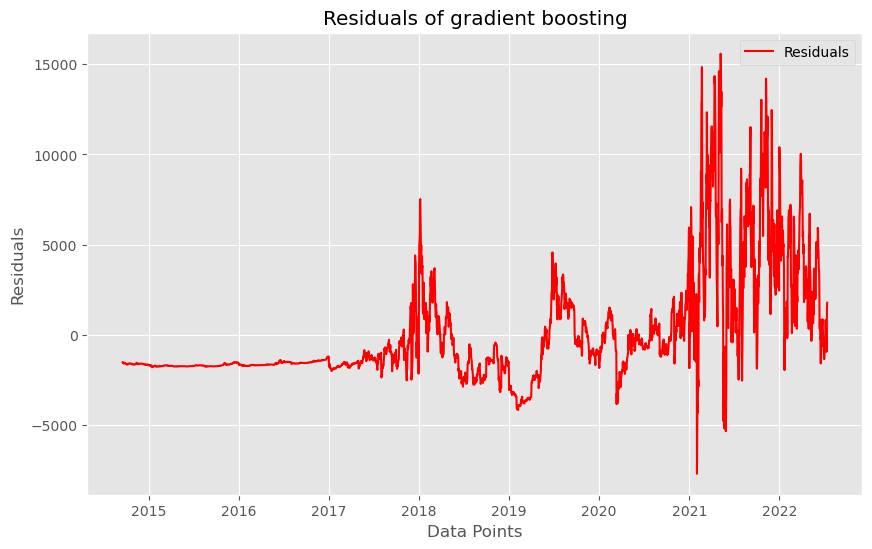

In [49]:
# Plot residuals
train_df['gboosting_residuals'] = train_df['Close'] - train_df['gboosting_model']


plt.figure(figsize=(10, 6))
plt.plot(train_df['gboosting_residuals'], label='Residuals', color='red')
plt.title('Residuals of gradient boosting')
plt.xlabel('Data Points')
plt.ylabel('Residuals')
plt.legend()
plt.grid(True)
plt.show()

In [50]:
mean_residuals = train_df['gboosting_residuals'].mean()
variance_residuals = train_df['gboosting_residuals'].var()

print(f"Mean of residuals: {mean_residuals}")

Mean of residuals: 25.451515277838524


In [51]:
sm.stats.acorr_ljungbox(train_df['gboosting_residuals'].dropna(), lags=[1,30,90,365,730], return_df=True)

,lb_stat,lb_pvalue
1,2626.607053,0.0
30,44971.998607,0.0
90,99677.284567,0.0
365,192334.096791,0.0
730,204306.544197,0.0


<Figure size 1000x600 with 0 Axes>

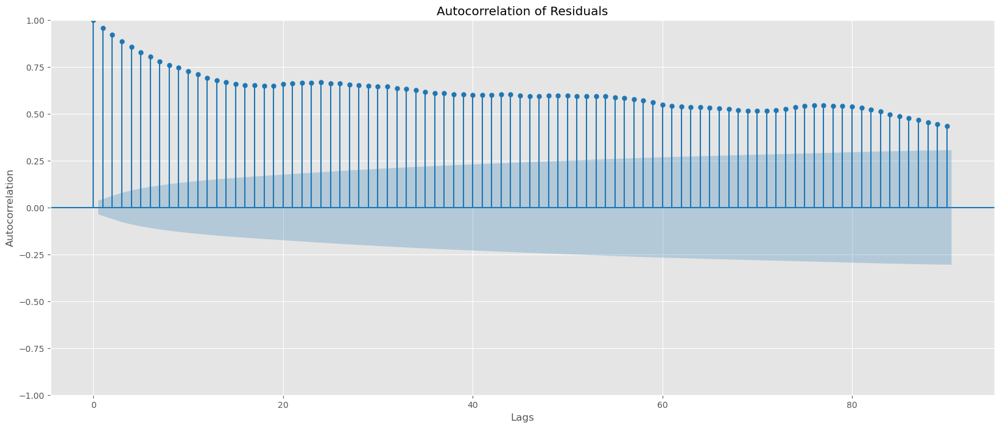

In [52]:
plt.figure(figsize=(10, 6))
plot_acf(train_df['gboosting_residuals'].dropna(), lags=90, alpha=0.05)
plt.title('Autocorrelation of Residuals')
plt.xlabel('Lags')
plt.ylabel('Autocorrelation')
plt.show()

The residuals do not exhibit a white noise pattern, suggesting that the model fails to capture certain structures present within the time series.

### Performance on the test data 

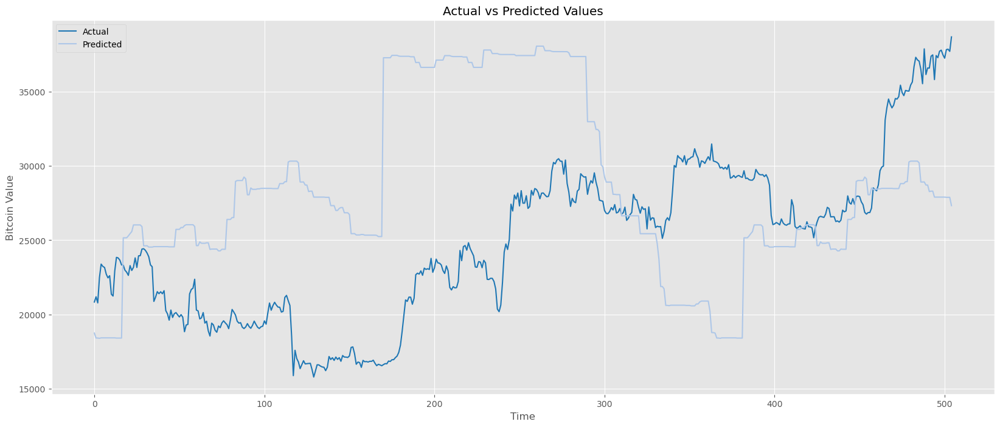

In [53]:
create_plot(test_df['Close'], testPredictions)

In [54]:
# calculate predictin metrics
gb_metrics = calculate_forecast_metrics(test_df.dropna(), actual_col='Close', benchmark_cols=['gboosting_prediction'])
gb_metrics.T

,MAE,MSE,RMSE,MAPE,R2
gboosting_prediction,7422.246569,7.865986e+07,8869.039299,32.770634,-1.724269


The predictions deviate significantly, and the model struggles to capture both the general trend and specific jumps in the test data. Although the gradient boosting model displays more volatility compared to the ARIMA(X) models, the predicted fluctuations are not accurately aligned with the actual data jumps.

## Merton jump diffusion model<a name="diffusion"></a>

Bitcoin value can be considerd a diffusion process as bitcoin and crypto currency in general is still a new market. As the timeseries has a lot of volatility the standard diffusion models did not perform well therefore try a jump diffusion model.

Based on the training data model 10.000 posiible pathes for the time of the test data set 

5 largest positive single day moves  [0.5916, 0.2681, 0.2306, 0.2222, 0.2027]
5 largest negative single day moves [-0.2016, -0.1931, -0.1662, -0.1579, -0.1539]
The probability of jump is 0.059 %


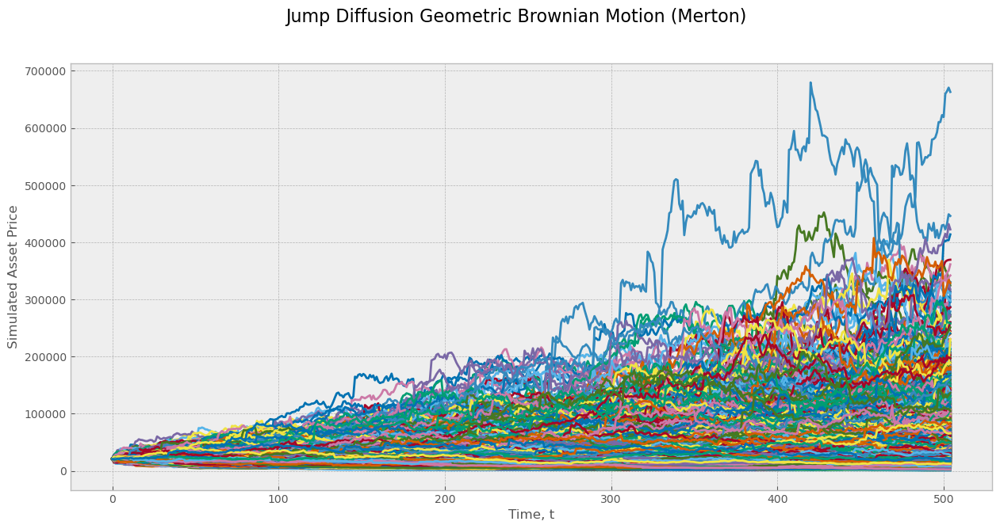

In [55]:
#create mertons jump diffusion model and simulate possible future pathes 
#alt.data_transformers.enable("vegafusion")
mp, jump_diffusion_examples = merton_jump_diffusion(train_df,'Close',len(test_df)) #add chart here for altair chart

As a prediction for the test data set use the average path of the 10.000 possible pathes

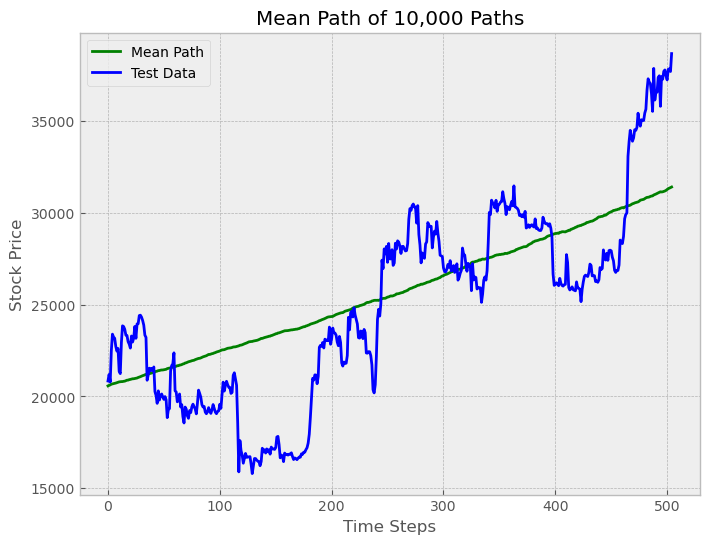

R-squared score: 0.5880966317314651


In [56]:
#avg path of all the simulated pathes compared to the test data 
mean_path = plot_avg_train(jump_diffusion_examples, test_df, 'Close',len(test_df))

In [57]:
plot_avg_train_alt(jump_diffusion_examples, test_df,'Close',len(test_df))

alt.Chart(...)

In [58]:
test_df['jd_prediction'] = mean_path

In [59]:
#calculate metrics for predictions with the mean_path
diffusion_metrics = calculate_forecast_metrics(test_df, actual_col='Close', benchmark_cols=['jd_prediction'])
diffusion_metrics.T

,MAE,MSE,RMSE,MAPE,R2
jd_prediction,2857.900131,1.189319e+07,3448.650967,12.694291,0.588097


# Result<a name="result"></a>

Compare the performance metrices of all the generated models

In [60]:
#combine all the mtrices
all_metrics_df = pd.concat([diffusion_metrics.T,gb_metrics.T,arima_metrics.T,benchmark_metrics.T, arimax_metrics.T],axis=0)

In [61]:
sorted_df = all_metrics_df.sort_values(by='MSE')
sorted_df.head(20)

,MAE,MSE,RMSE,MAPE,R2
jd_prediction,2857.900131,1.189319e+07,3448.650967,12.694291,0.588097
arimax_prediction,3364.390961,1.759863e+07,4195.072128,15.502013,0.390497
bench_drift_Close,4259.440336,2.769475e+07,5262.579713,16.324904,0.040833
arima3_1_0_prediction,5551.118261,4.761991e+07,6900.717792,20.416673,-0.649246
arima3_1_1_prediction,5551.135243,4.762020e+07,6900.739054,20.416722,-0.649256
arima1_1_3_prediction,5552.006300,4.763591e+07,6901.877103,20.419154,-0.649800
arima0_1_3_prediction,5552.128618,4.763819e+07,6902.042687,20.419486,-0.649879
arima0_1_2_prediction,5555.576444,4.770107e+07,6906.596149,20.429039,-0.652057
arima2_1_0_prediction,5555.834507,4.770574e+07,6906.934289,20.429758,-0.652219
arima2_1_1_prediction,5558.658884,4.775253e+07,6910.320290,20.438141,-0.653839


Only the jump diffusion model, ARIMAX model perform better than the benchmaring models. The best predictions are achived with the mean path of the jump diffusion model as this method as th lowest MAE,MSE, RMSE and MAPE score and the highest R2 score 

# Investment strategy<a name="investment"></a>

## Daily Returns<a name="returns"></a>

Compare the ARIMAX and the Merton Jump Diffusion model to check which model gives a better estimate of the daily returns (short term investment) 

Daily returns of ARIMAX predictions

In [62]:
train_df['ARIMAX_pred_transform'] = inverse_bocxcx(train_df['ARIMAX_prediction'], lambda_optimal)

In [63]:
# Calculate daily returns
train_df['daily_returns'] = np.log(train_df['Close'] / train_df['Close'].shift(1))

# Generate positions based on the predictions
train_df['position'] = np.sign(train_df['ARIMAX_pred_transform'] - train_df['Close'].shift(1))

# Calculate strategy returns
train_df['strategy_arimax_returns'] = train_df['position'].shift(1) * train_df['daily_returns']


In [64]:
# Calculate daily returns
test_df['daily_returns'] = np.log(test_df['Close'] / test_df['Close'].shift(1))

# Generate positions based on the predictions
test_df['position'] = np.sign(test_df['arimax_prediction'] - test_df['Close'].shift(1))

# Calculate strategy returns
test_df['strategy_arimax_returns'] = test_df['position'].shift(1) * test_df['daily_returns']


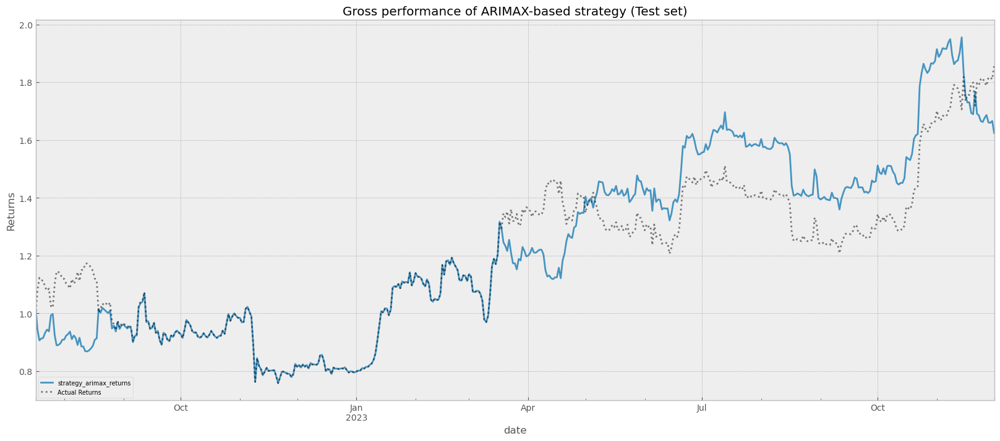

In [65]:
test_df['strategy_arimax_returns'].dropna().cumsum().apply(np.exp).plot(alpha=0.9)
plt.plot(test_df['daily_returns'].dropna().cumsum().apply(np.exp), color='black', label='Actual Returns', alpha=0.5, linestyle='dotted')
plt.ylabel("Returns")
plt.title("Gross performance of ARIMAX-based strategy (Test set)")
plt.legend(loc='lower left', fontsize='x-small')
plt.show()

In [66]:
# Drop NaN values and calculate cumulative returns for the strategy and actual returns
strategy_returns = test_df['strategy_arimax_returns'].dropna().cumsum().apply(np.exp)
actual_returns = test_df['daily_returns'].dropna().cumsum().apply(np.exp)
actual_returns = actual_returns.iloc[1:] 

# Create a DataFrame for plotting
plot_df = pd.DataFrame({
    'Date': actual_returns.index,  # Assuming the index contains the dates
    'Strategy Returns': strategy_returns,
    'Actual Returns': actual_returns
})

# Melt the DataFrame for Altair's plotting
melted_df = plot_df.melt('Date', var_name='Type', value_name='Returns')

# Create the Altair chart
alt_chart = alt.Chart(melted_df).mark_line().encode(
    x=alt.X('Date:T', axis=alt.Axis(format='%Y-%m')),
    y='Returns:Q',
    #color='Type:N'
    color=alt.Color('Type:N', scale=alt.Scale(range=custom_colors))
).properties(
    width=800,
    height=300,
    title='Gross Performance of ARIMAX-based Strategy (Test set)'
).configure_point(
    size=10
)

# Save the chart
alt_chart.save('graphs/btcusd/arimax_returns.json')
alt_chart

alt.Chart(...)

Daily returns of Jump Diffusion predictions

In [67]:
# Calculate daily returns
test_df['daily_returns'] = np.log(test_df['Close'] / test_df['Close'].shift(1))

# Generate positions based on the predictions
test_df['position_jd'] = np.sign(test_df['jd_prediction'] - test_df['Close'].shift(1))

# Calculate strategy returns
test_df['strategy_jd_returns'] = test_df['position_jd'].shift(1) * test_df['daily_returns']

test_df.head()

,date,Open,High,Low,Close,Adj Close,Volume,currency,Dataset,bench_mean_Close,...,month,day,weekday,gboosting_prediction,jd_prediction,daily_returns,position,strategy_arimax_returns,position_jd,strategy_jd_returns
date,,,,,,,,,,,,,,,,,,,,,
2022-07-15,2022-07-15,20573.156250,21138.244141,20397.000000,20836.328125,20836.328125,25905575359,BTC-USD,Test,12460.989965,...,7,15,4,18745.691406,20569.919922,NaN,NaN,NaN,NaN,NaN
2022-07-16,2022-07-16,20834.103516,21514.404297,20518.898438,21190.316406,21190.316406,24302954056,BTC-USD,Test,12460.989965,...,7,16,5,18412.509766,20594.349136,0.016846,-1.0,NaN,-1.0,NaN
2022-07-17,2022-07-17,21195.041016,21600.640625,20778.179688,20779.343750,20779.343750,22927802083,BTC-USD,Test,12460.989965,...,7,17,6,18412.509766,20622.638882,-0.019585,-1.0,0.019585,-1.0,0.019585
2022-07-18,2022-07-18,20781.912109,22633.033203,20781.912109,22485.689453,22485.689453,39974475562,BTC-USD,Test,12460.989965,...,7,18,0,18394.464844,20661.694157,0.078920,-1.0,-0.078920,-1.0,-0.078920
2022-07-19,2022-07-19,22467.849609,23666.962891,21683.406250,23389.433594,23389.433594,48765202697,BTC-USD,Test,12460.989965,...,7,19,1,18424.955078,20675.563718,0.039405,-1.0,-0.039405,-1.0,-0.039405


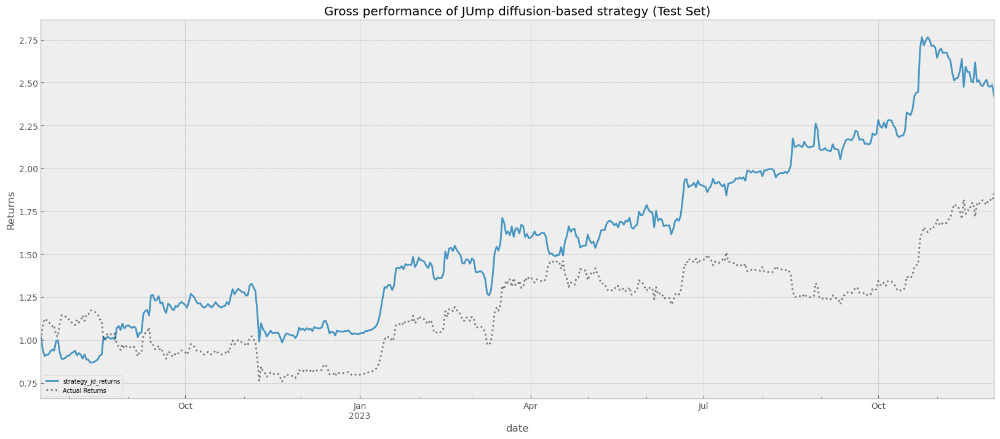

In [68]:
test_df['strategy_jd_returns'].dropna().cumsum().apply(np.exp).plot(alpha=0.9)
plt.plot(test_df['daily_returns'].dropna().cumsum().apply(np.exp), color='black', label='Actual Returns', alpha=0.5, linestyle='dotted')
plt.ylabel("Returns")
plt.title("Gross performance of JUmp diffusion-based strategy (Test Set)")
plt.legend(loc='lower left', fontsize='x-small')
plt.show()

In [69]:
# Drop NaN values and calculate cumulative returns for the strategy and actual returns
strategy_returns = test_df['strategy_jd_returns'].dropna().cumsum().apply(np.exp)
actual_returns = test_df['daily_returns'].dropna().cumsum().apply(np.exp)
actual_returns = actual_returns.iloc[1:] 

# Create a DataFrame for plotting
plot_df = pd.DataFrame({
    'Date': actual_returns.index,  # Assuming the index contains the dates
    'Strategy Returns': strategy_returns,
    'Actual Returns': actual_returns
})

# Melt the DataFrame for Altair's plotting
melted_df = plot_df.melt('Date', var_name='Type', value_name='Returns')

# Create the Altair chart
alt_chart = alt.Chart(melted_df).mark_line().encode(
    x=alt.X('Date:T', axis=alt.Axis(format='%Y-%m')),
    y='Returns:Q',
    #color='Type:N'
    color=alt.Color('Type:N', scale=alt.Scale(range=custom_colors))
).properties(
    width=800,
    height=300,
    title='Gross Performance of Jump Diffusion-based Strategy (Test set)'
).configure_point(
    size=10
)

# Save the chart
alt_chart.save('graphs/btcusd/arimax_returns.json')
alt_chart

alt.Chart(...)

Based on the returns the ARIMAX model is better for a short term investment strategy

In [70]:
if 'date' in test_df.columns:
    test_df.set_index('date', inplace=True)    

# Calculate daily returns for the Close prices
test_df['daily_returns'] = np.log(test_df['Close'] / test_df['Close'].shift(1))

# Apply the strategy to each benchmark
benchmark_cols = ['bench_mean_Close', 'bench_naive_Close', 'bench_drift_Close', 'bench_seasonal_naive_Close']
for col in benchmark_cols:
    # Compare predicted value (benchmark) with previous actual value
    test_df['position'] = np.sign(test_df[col] - test_df['Close'].shift(1))

    # Calculate strategy returns
    test_df[f'strategy_{col}'] = test_df['position'].shift(1) * test_df['daily_returns']

# Calculate cumulative returns for each strategy and the actual returns
for col in benchmark_cols:
    test_df[f'cumulative_{col}'] = test_df[f'strategy_{col}'].cumsum().apply(np.exp)

test_df['cumulative_actual'] = test_df['daily_returns'].cumsum().apply(np.exp)

# Filter only the relevant columns for plotting
plot_cols = [f'cumulative_{col}' for col in benchmark_cols] + ['cumulative_actual']
test_df_plot = test_df.reset_index()[['date'] + plot_cols]

# Melt the DataFrame for Altair
melted_df = test_df_plot.melt('date', var_name='Strategy', value_name='Cumulative Returns')

# Custom color palette
custom_colors = ["#948B80", "#625D56", "#312E2B", "#875C62", "#5F4045", "#B79DA1",
                 "#417156", "#2E4F3C", "#6D7C73"]

# Create an Altair chart
chart = alt.Chart(melted_df).mark_line().encode(
    x=alt.X('date:T', axis=alt.Axis(format='%Y-%m')),
    y=alt.Y('Cumulative Returns:Q', scale=alt.Scale(domain=[melted_df['Cumulative Returns'].min() - 0.01, melted_df['Cumulative Returns'].max() + 0.01])),
    color=alt.Color('Strategy:N', scale=alt.Scale(range=custom_colors)),
    tooltip=['date', 'Strategy', 'Cumulative Returns']
).properties(
    title='Day Trading Benchmark Strategy Returns',
    width=800,
    height=300
)

chart.display()

alt.Chart(...)

## Long term investments<a name="longInv"></a>

Create a strategy for long term investments with the jump diffusion model with checking the distribution of the profit and loss of the 10000 different pathes generated

In [71]:
S0 = train_df.iloc[-1]['Close']

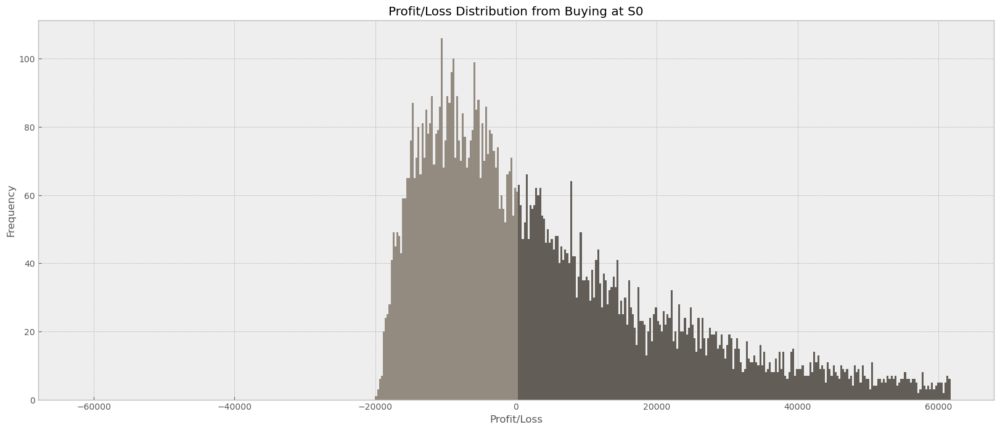

Mean: 10843.252571702815
Minimum: -19929.25445332777
Maximum: 642339.3417807668
25th percentile (Q1): -8780.959655244527
Median (50th percentile): 795.4979811406829
75th percentile (Q3): 17865.392892456402


In [72]:
get_profit_loss(S0, jump_diffusion_examples)

# Outlook<a name="outlook"></a>

Utilizing the comprehensive dataset, we aim to forecast the profit-loss distribution for the upcoming year using the jump diffusion model. This analysis seeks to assess the level of risk associated with Bitcoin investments in the coming year, enabling us to provide informed recommendations for the year 2024.

5 largest positive single day moves  [0.5916, 0.2681, 0.2306, 0.2222, 0.2027]
5 largest negative single day moves [-0.2016, -0.1931, -0.1662, -0.1579, -0.1539]
The probability of jump is 0.059 %


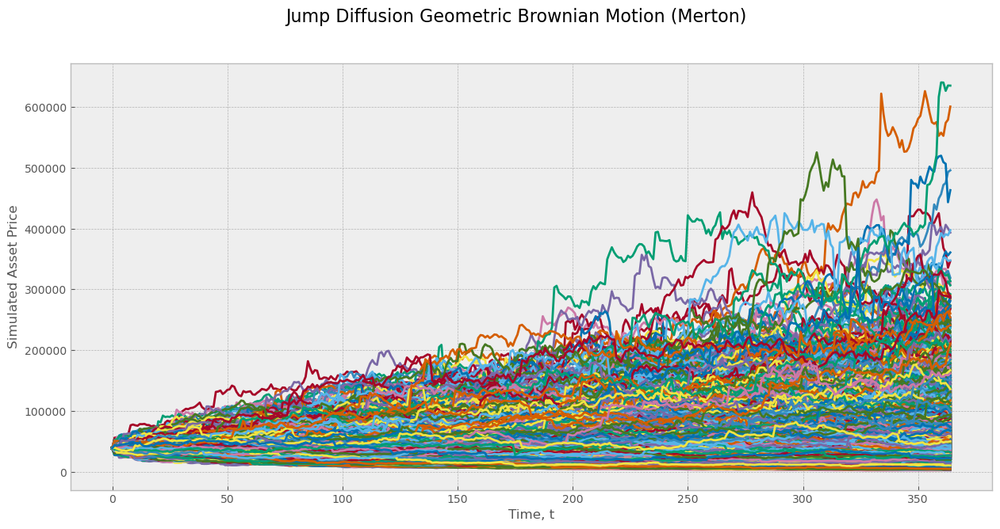

In [73]:
mp, jump_diffusion_examples = merton_jump_diffusion(bitcoin_df,'Close',365)

In [74]:
S0 = bitcoin_df.iloc[-1]['Close']
start_date = bitcoin_df.iloc[-1]['date']
paths_array = np.array(jump_diffusion_examples)
# Calculate the mean path
mean_path = np.mean(paths_array, axis=0)
num_days = 365

In [75]:
dates = generate_date_list(start_date, num_days)

In [76]:
# Create a DataFrame with the dates and mean_path
df = pd.DataFrame({'Date': dates, 'Mean_Path': mean_path})

# Altair plot
chart = alt.Chart(df).mark_line(color='#948B80').encode(
    #x='Date:T',
    x=alt.X('Date:T', axis=alt.Axis(format='%Y-%m')),
    #y='Mean_Path:Q',
    y=alt.Y('Mean_Path:Q', scale=alt.Scale(domain=[20000, 60000])),
    
).properties(
    title='Mean Path of 10,000 Paths',
    width=700,
    height=200
)

# Show the Altair plot
chart

alt.Chart(...)

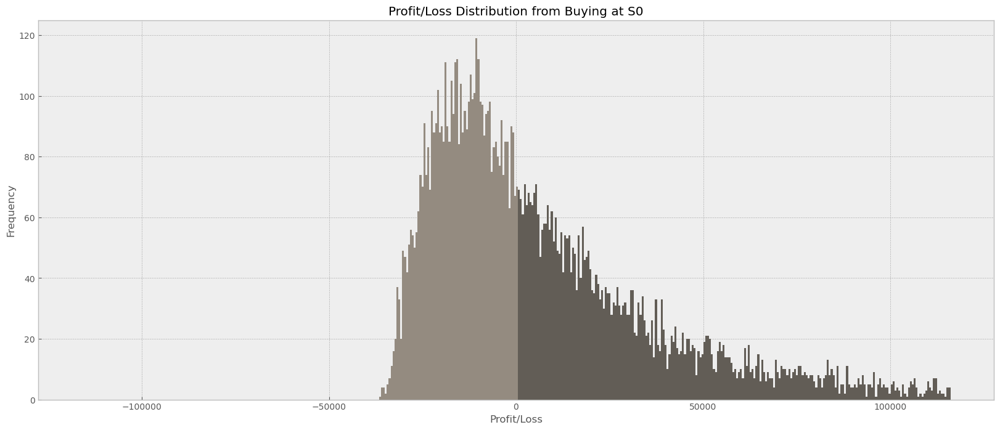

Mean: 10568.381698562842
Minimum: -36161.323432876125
Maximum: 596390.0000819089
25th percentile (Q1): -15048.335643866812
Median (50th percentile): -947.4015275191523
75th percentile (Q3): 22625.516208541347


In [77]:
get_profit_loss(S0, jump_diffusion_examples)

# LSTM Neural Network<a name="lstm"></a>

In the context of statistical methodologies, it has been observed that while the trend in the test data is predictable, the volatility is not. An exploration involves testing the efficacy of an LSTM neural network in predicting the volatility aspect.

In [78]:
from fastai.tabular.all import *
from sklearn.preprocessing import MinMaxScaler
import torch
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split

test_df['date'] = test_df.index

train_df_lstm = train_df.copy()
test_df_lstm = test_df.copy()
window_size = 30

def preprocess(df, window_size=window_size, valid_pct=0.2, train=True):
    # Scale the 'Close' column
    scaler = MinMaxScaler()
    close_scaled = scaler.fit_transform(df[['Close']])
    
    # Ensure that you have enough data points to create sequences
    if len(close_scaled) < window_size + 1:
        raise ValueError("Not enough data points to create sequences.")

    
    # Prepare sequences
    sequences = L([torch.tensor(close_scaled[i:i+window_size], dtype=torch.float32) 
                   for i in range(len(close_scaled)-window_size)])
    targets = L([torch.tensor(close_scaled[i+window_size], dtype=torch.float32) 
                 for i in range(len(close_scaled)-window_size)])

    # Check if sequences are created
    if not sequences or not targets:
        raise ValueError("No sequences or targets were created. Check your data and window size.")
    
    if train:
        # Split data into training and validation sets
        train_size = int(len(sequences) * (1 - valid_pct))
        train_sequences, train_targets = sequences[:train_size], targets[:train_size]
        valid_sequences, valid_targets = sequences[train_size:], targets[train_size:]
        train_dates = df['date'][:len(train_targets)].reset_index(drop=True)
        valid_dates = df['date'][:len(valid_targets)].reset_index(drop=True)
        # Create DataLoader from sequences
        train_ds = list(zip(train_sequences, train_targets))
        valid_ds = list(zip(valid_sequences, valid_targets))
        dls = DataLoaders.from_dsets(train_ds, valid_ds, bs=32, shuffle=False,)
        return dls, [train_dates, valid_dates], scaler
    else:
        # Assuming sequences and targets are your full dataset
        train_ds = list(zip(sequences, targets))
        # Create a DataLoader for training
        dates = df['date'][:len(targets)].reset_index(drop=True)
        dls = DataLoader(train_ds, batch_size=32, shuffle=False)
        return dls, [dates], scaler
    
train_loader, train_dates, train_scaler = preprocess(train_df_lstm)
test_loader, test_dates, test_scaler = preprocess(test_df_lstm, train=False)

print(train_dates[0][0], train_dates[0][-1:])
print(train_dates[1][0], train_dates[1][-1:])
print(test_dates[0][0], test_dates[0][-1:])

2014-09-17 00:00:00 2261   2020-11-25
Name: date, dtype: datetime64[ns]
2014-09-17 00:00:00 565   2016-04-04
Name: date, dtype: datetime64[ns]
2022-07-15 00:00:00 474   2023-11-01
Name: date, dtype: datetime64[ns]


In [79]:
test_df_lstm.head()

,Open,High,Low,Close,Adj Close,Volume,currency,Dataset,bench_mean_Close,bench_naive_Close,...,strategy_bench_mean_Close,strategy_bench_naive_Close,strategy_bench_drift_Close,strategy_bench_seasonal_naive_Close,cumulative_bench_mean_Close,cumulative_bench_naive_Close,cumulative_bench_drift_Close,cumulative_bench_seasonal_naive_Close,cumulative_actual,date
date,,,,,,,,,,,,,,,,,,,,,
2022-07-15,20573.156250,21138.244141,20397.000000,20836.328125,20836.328125,25905575359,BTC-USD,Test,12460.989965,20569.919922,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-07-15
2022-07-16,20834.103516,21514.404297,20518.898438,21190.316406,21190.316406,24302954056,BTC-USD,Test,12460.989965,20569.919922,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.016989,2022-07-16
2022-07-17,21195.041016,21600.640625,20778.179688,20779.343750,20779.343750,22927802083,BTC-USD,Test,12460.989965,20569.919922,...,0.019585,0.019585,0.019585,-0.019585,1.019778,1.019778,1.019778,0.980606,0.997265,2022-07-17
2022-07-18,20781.912109,22633.033203,20781.912109,22485.689453,22485.689453,39974475562,BTC-USD,Test,12460.989965,20569.919922,...,-0.078920,-0.078920,-0.078920,0.078920,0.942391,0.942391,0.942391,1.061130,1.079158,2022-07-18
2022-07-19,22467.849609,23666.962891,21683.406250,23389.433594,23389.433594,48765202697,BTC-USD,Test,12460.989965,20569.919922,...,-0.039405,-0.039405,-0.039405,0.039405,0.905978,0.905978,0.905978,1.103779,1.122531,2022-07-19


In [80]:
class MyLSTM(torch.nn.Module):
    def __init__(self, input_size, hidden_layer_size=100, output_size=1):
        super().__init__()
        self.hidden_layer_size = hidden_layer_size
        self.lstm = torch.nn.LSTM(input_size, hidden_layer_size)
        self.linear = torch.nn.Linear(hidden_layer_size, output_size)
        self.hidden_cell = (torch.zeros(1,1,self.hidden_layer_size),
                            torch.zeros(1,1,self.hidden_layer_size))

    def forward(self, input_seq):
        # Detach the hidden cell state to prevent backpropagating through the entire training history
        self.hidden_cell = (self.hidden_cell[0].detach(), self.hidden_cell[1].detach())

        lstm_out, self.hidden_cell = self.lstm(input_seq.view(len(input_seq), 1, -1), self.hidden_cell)
        predictions = self.linear(lstm_out.view(len(input_seq), -1))
        return predictions.squeeze()

model = MyLSTM(input_size=window_size)  # Ensure input_size matches the sequence length
learn = Learner(train_loader, model, loss_func=torch.nn.MSELoss(), metrics=[mse])
learn.fit_one_cycle(5)

epoch,train_loss,valid_loss,mse,time
0,0.001407,0.027448,0.025883,00:00
1,0.000783,0.013793,0.011751,00:00
2,0.000631,0.016270,0.014171,00:00
3,0.000477,0.010612,0.008301,00:00
4,0.000389,0.008972,0.006569,00:00


In [81]:
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

In [82]:
# Switch to evaluation mode
learn.model.eval()

# Get predictions for training set
train_preds, train_targets = learn.get_preds(dl=train_loader.train)

# Convert to NumPy arrays
train_preds = train_preds.numpy().flatten()
train_targets = train_targets.numpy().flatten()

train_dates[0] = pd.to_datetime(train_dates[0])

rescaled_targets = pd.DataFrame(train_scaler.inverse_transform(pd.DataFrame(train_targets)))
rescaled_preds = pd.DataFrame(train_scaler.inverse_transform(pd.DataFrame(train_preds)))

# Creating a DataFrame for the plot
data = pd.DataFrame({
    'Date': train_dates[0],
    'Actual_Values': rescaled_targets[rescaled_targets.columns[0]],
    'Predicted_Values': rescaled_preds[rescaled_preds.columns[0]],
    'Residuals': rescaled_targets[rescaled_targets.columns[0]] - rescaled_preds[rescaled_preds.columns[0]]
})

data['Upper'] = 2 / np.sqrt(len(data))
data['Lower'] = -2 / np.sqrt(len(data))

# Melting the DataFrame for Altair
data_long = data.melt('Date', var_name='Category', value_name='Value')

# Define the custom color scheme
domain = ['Actual_Values', 'Predicted_Values']
range_ = ["#625D56", "#875C62"]  # Select appropriate colors from your custom palette

# Create the line chart
line_chart = alt.Chart(data_long).mark_line().encode(
    x=alt.X('Date:T', axis=alt.Axis(format=("%Y-%m"))),
    y=alt.Y('Value:Q', scale=alt.Scale(domain=[data['Actual_Values'].min() - 0.01, data['Actual_Values'].max() + 0.01 ])),
    color=alt.Color('Category:N', scale=alt.Scale(domain=domain, range=range_)),
    tooltip=['Date:T', 'Value:Q', 'Category:N']
).properties(
    width=700,
    height=450,
    
)


# Residuals plot
residuals_chart = alt.Chart(data).mark_bar(opacity=0.7, color="#875C62", size=1).encode(
    x=alt.X('Date:T', axis=alt.Axis(format='%Y-%m', labels=False), title=None),
    y='Residuals:Q',
    tooltip=['Date:T', 'Residuals:Q']
).properties(
    width=700,
    height=50,
    title='Training Set LSTM: Actual vs Predicted Values'
)

ci = residuals_chart.mark_area(opacity=0.3, color="#F6E8D6", size=1).encode(
    x=alt.X('Date:T', axis=alt.Axis(format='%Y-%m', labels=False), title=None),
    y='Upper:Q',
    y2='Lower:Q'
).properties(
    width=700,
    height=50
)

# Combine the charts
combined_chart = alt.vconcat(residuals_chart+ci, line_chart, ).resolve_scale(
    x='shared'  # Ensure the x-axis is aligned
).properties()

#combined_chart.to_json("graphs/eurusd/lstmtrain.json")
combined_chart

alt.VConcatChart(...)

In [83]:
# Switch to evaluation mode
learn.model.eval()

# Get predictions for training set
test_preds, test_targets = learn.get_preds(dl=test_loader)

# Convert to NumPy arrays
test_preds = test_preds.numpy().flatten()
test_targets = test_targets.numpy().flatten()

rescaled_targets = pd.DataFrame(test_scaler.inverse_transform(pd.DataFrame(test_targets)))
rescaled_preds = pd.DataFrame(test_scaler.inverse_transform(pd.DataFrame(test_preds)))

test_dates[0] = pd.to_datetime(test_dates[0])

# Creating a DataFrame for the plot
data = pd.DataFrame({
    'Date': test_dates[0],
    'Actual_Values': rescaled_targets[rescaled_targets.columns[0]],
    'Predicted_Values': rescaled_preds[rescaled_preds.columns[0]],
    'Residuals': rescaled_targets[rescaled_targets.columns[0]] - rescaled_preds[rescaled_preds.columns[0]]
})

data['Upper'] = 2 / np.sqrt(len(data))
data['Lower'] = -2 / np.sqrt(len(data))

# Melting the DataFrame for Altair
data_long = data.melt('Date', var_name='Category', value_name='Value')

# Define the custom color scheme
domain = ['Actual_Values', 'Predicted_Values']
range_ = ["#625D56", "#875C62"]  # Select appropriate colors from your custom palette

# Create the line chart
line_chart = alt.Chart(data_long).mark_line().encode(
    x=alt.X('Date:T', axis=alt.Axis(format=("%Y-%m"))),
    y=alt.Y('Value:Q', scale=alt.Scale(domain=[data['Actual_Values'].min() - 0.01, data['Actual_Values'].max() + 0.01 ])),
    color=alt.Color('Category:N', scale=alt.Scale(domain=domain, range=range_)),
    tooltip=['Date:T', 'Value:Q', 'Category:N']
).properties(
    width=700,
    height=450,
    
)


# Residuals plot
residuals_chart = alt.Chart(data).mark_bar(opacity=0.7, color="#875C62", size=1).encode(
    x=alt.X('Date:T', axis=alt.Axis(format='%Y-%m', labels=False), title=None),
    y='Residuals:Q',
    tooltip=['Date:T', 'Residuals:Q']
).properties(
    width=700,
    height=50,
    title='Test Set LSTM: Actual vs Predicted Values'
)

ci = residuals_chart.mark_area(opacity=0.3, color="#F6E8D6", size=1).encode(
    x=alt.X('Date:T', axis=alt.Axis(format='%Y-%m', labels=False), title=None),
    y='Upper:Q',
    y2='Lower:Q'
).properties(
    width=700,
    height=50
)

# Combine the charts
combined_chart = alt.vconcat(residuals_chart+ci, line_chart, ).resolve_scale(
    x='shared'  # Ensure the x-axis is aligned
).properties()

combined_chart.to_json("graphs/eurusd/lstmtest.json")
combined_chart

alt.VConcatChart(...)

In [84]:
# Starting with the last window of actual data
current_window = test_preds[-window_size:].tolist()

# List to store future predictions
future_predictions = []

# Predicting the next 'n_future_steps' values
n_future_steps = 365
for _ in range(n_future_steps):
    # Use current window to predict the next value
    with torch.no_grad():
        current_window_tensor = torch.tensor(current_window[-window_size:]).view(1, -1, 1).float()
        next_pred = model(current_window_tensor).item()
    
    # Append prediction to future predictions
    future_predictions.append(next_pred)

    # Update the current window
    current_window.append(next_pred)

rescaled_predictions = pd.DataFrame(test_scaler.inverse_transform(pd.DataFrame(future_predictions)))
    
# Plotting
future_dates = pd.date_range(start=test_dates[0].iloc[-1], periods=n_future_steps, freq='D')


# Creating a DataFrame for the plot
data = pd.DataFrame({
    'Date': future_dates,
    'Predicted_Values': rescaled_predictions[rescaled_preds.columns[0]]
})

# Melting the DataFrame for Altair
data_long = data.melt('Date', var_name='Category', value_name='Value')

# Define the custom color scheme
domain = ['Predicted_Values']
range_ = ["#625D56", "#875C62"]  # Select appropriate colors from your custom palette

# Create the line chart
line_chart = alt.Chart(data_long).mark_line().encode(
    x=alt.X('Date:T', axis=alt.Axis(format=("%Y-%m"))),
    y=alt.Y('Value:Q', scale=alt.Scale(domain=[data['Predicted_Values'].min() - 0.01, data['Predicted_Values'].max() + 0.01 ])),
    color=alt.Color('Category:N', scale=alt.Scale(domain=domain, range=range_)),
    tooltip=['Date:T', 'Value:Q', 'Category:N']
).properties(
    width=700,
    height=200,
    title="LSTM Model Prediction for 2024"
)

line_chart

alt.Chart(...)